## Defining the Question

### a) Specifying the Question

The research question is to identify various factors that lead to staff attrition. 

Additionally, we would like to come up with recommendations to improve staff retention.


### b) Defining the Metric for Success

For this analysis to be considered successful, the following areas must be covered:
1. Overall Exploratory Data Analysis. 
2. Univariate Analysis. 
3. Bivariate Analysis.
4. Multivariate Analysis.
5. Use Appropriate Visualizations.
6. 

### c) Understanding the context 

Staff attrition refers to the loss of employees through a natural process, such as retirement, resignation, elimination of a position, personal health, or other similar reasons. 

A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork and new hire training are some of the common expenses of losing employees and replacing them. 

Another problem posed by attrition is that it may lead to loss of customers as customers often prefer to interact with familiar people. 

Additionally, Errors and issues are more likely if you constantly have new workers.

Given the various drawbacks of attrition on a company, it is important to understand factors that contribute to employees leaving a company so that the company can put measures in place to mitigate this.

### d) Recording the Experimental Design

The following steps will be followed in conducting this study:
1. Defining the Question 
2. Reading the Data.
3. Checking the Data.
4. Performing Univariate and Bivariate Analysis.
5. Creating Visualizations.
6. Implementing The Solution.
7. Conclusions and Recommendations. 

### e) Data Relevance

The data provided aligns with the context of our study. This data was extracted from dataworld https://data.world/juhipathak7/hr-attrition-data 

The dataset contains crucial information about the employees working and who worked at the company including their job role, department, level of education, hourly rate, marital status, distance they have to cover from home to work, job satisfaction level, age and how many years they worked with the company.    

All this information will help us analyze if these factors determine whether an employee is most likely to leave the company.

## Reading the Data

### Importing our Libraries

In [ ]:
# installing the necessary libraries not in google colab
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Created wheel for pandas-profiling: filename=pandas_profiling-2.10.0-py2.py3-none-any.whl size=239950 sha256=c9c72c24ddb9b63dc13c512bcb3d7445585f5ad2b15aba412ff52b9611e86f2a
  Stored in directory: /tmp/pip-ephem-wheel-cache-p6kveyj2/wheels/56/c2/dd/8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
Successfully built pandas-profiling


In [ ]:
# Let us first import all the libraries we will need for our analysis
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline
from pandas_profiling import ProfileReport
from scipy import stats
from scipy.stats import norm
from scipy.stats import t
import math
from scipy.stats import ttest_ind
import statsmodels.api as sm
import plotly.express as px

In [ ]:
# let us set the warnings that may appear in our analysis off

import warnings
warnings.filterwarnings('ignore') 

# subsequently let us set the pandas warning for chained assignments off
pd.options.mode.chained_assignment = None  # default='warn'

### Loading our Dataset

In [ ]:
# Loading the Dataset from the source i.e. csv
url = '/content/WAFnUseCHREmployeeAttrition (1).csv'

df = pd.read_csv(url)

### Previewing the Dataset 

In [ ]:
# previewing the first five entries of the dataset

df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [ ]:
# previewing the last five entries of the dataset

df.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,3,Male,41,4,2,Laboratory Technician,4,Married,2571,12290,4,Y,No,17,3,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,4,Male,42,2,3,Healthcare Representative,1,Married,9991,21457,4,Y,No,15,3,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,2,Male,87,4,2,Manufacturing Director,2,Married,6142,5174,1,Y,Yes,20,4,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,4,Male,63,2,2,Sales Executive,2,Married,5390,13243,2,Y,No,14,3,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,2,Male,82,4,2,Laboratory Technician,3,Married,4404,10228,2,Y,No,12,3,1,80,0,6,3,4,4,3,1,2


## Checking the Data

In [ ]:
# Determining the no. of records in our dataset
#
print('This dataset has ' + str(df.shape[0]) + ' rows, and ' + str(df.shape[1]) + ' columns')

This dataset has 1470 rows, and 35 columns


In [ ]:
# Checking whether each column has an appropriate datatype
#
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

In [ ]:
# checking the dataset information

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [ ]:
# Let us view the summary statistics of our dataset

df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [ ]:
# let us see the columns in our dataframe
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [ ]:
# Checking the entire profile of the dataframe

profile = ProfileReport(df, title="Staff Attrition Dataset", html={'style':{'full_width':True}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/48 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# let us save our profile report
profile.to_file(output_file="StaffAttrition_Dataset_Profile_Report.html") 

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Data Cleaning

In [ ]:
# From our profile report, we can see that we don't have any duplicated rows
# But let us check 
df.duplicated().sum()

0

In [ ]:
# Let Us Drop columns we will not need for this analysis


df.drop(['EmployeeCount','EmployeeNumber', 'Over18', 'StandardHours', 'MonthlyRate'], axis = 1, inplace = True)

# let us confirm that we have dropped the unnecessary columns

df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,9,No,12,3,4,1,6,3,3,2,2,2,2


In [ ]:
# Removing the spaces and setting all column names to lower case

df.columns = df.columns.str.lower().str.replace(" ", "_")
df.head()


,age,attrition,businesstravel,dailyrate,department,distancefromhome,education,educationfield,environmentsatisfaction,gender,hourlyrate,jobinvolvement,joblevel,jobrole,jobsatisfaction,maritalstatus,monthlyincome,numcompaniesworked,overtime,percentsalaryhike,performancerating,relationshipsatisfaction,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,9,No,12,3,4,1,6,3,3,2,2,2,2


In [ ]:
# From our profile report we can see that there are no null values 
# Let us just check again
df.isnull().sum()

age                         0
attrition                   0
businesstravel              0
dailyrate                   0
department                  0
distancefromhome            0
education                   0
educationfield              0
environmentsatisfaction     0
gender                      0
hourlyrate                  0
jobinvolvement              0
joblevel                    0
jobrole                     0
jobsatisfaction             0
maritalstatus               0
monthlyincome               0
numcompaniesworked          0
overtime                    0
percentsalaryhike           0
performancerating           0
relationshipsatisfaction    0
stockoptionlevel            0
totalworkingyears           0
trainingtimeslastyear       0
worklifebalance             0
yearsatcompany              0
yearsincurrentrole          0
yearssincelastpromotion     0
yearswithcurrmanager        0
dtype: int64

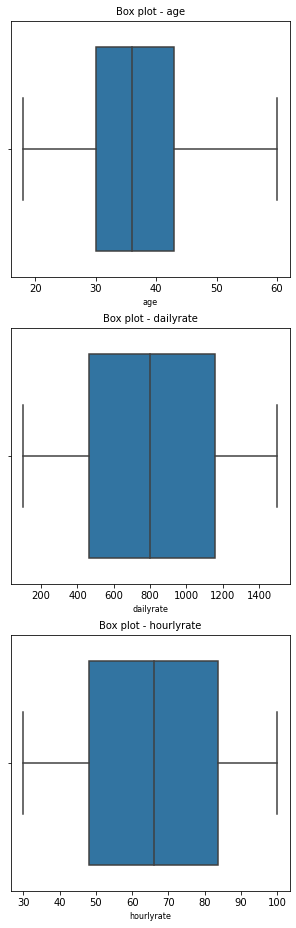

In [ ]:
# Checking for Anomalies
# 
# Checking for outliers in the columns with numerical data
col_names = ['age','dailyrate', 'hourlyrate']

fig, ax = plt.subplots(len(col_names), figsize=(5,16))

for i, col_val in enumerate(col_names):
    sns.boxplot(df[col_val], ax=ax[i])
    ax[i].set_title('Box plot - {}'.format(col_val), fontsize=10)
    ax[i].set_xlabel(col_val, fontsize=8)
plt.show()

## EXPLORATORY DATA ANALYSIS

### UNIVARIATE ANALYSIS

## a) Numerical Analysis

In [ ]:
# finding the information about the variables
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 30 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   age                       1470 non-null   int64 
 1   attrition                 1470 non-null   object
 2   businesstravel            1470 non-null   object
 3   dailyrate                 1470 non-null   int64 
 4   department                1470 non-null   object
 5   distancefromhome          1470 non-null   int64 
 6   education                 1470 non-null   int64 
 7   educationfield            1470 non-null   object
 8   environmentsatisfaction   1470 non-null   int64 
 9   gender                    1470 non-null   object
 10  hourlyrate                1470 non-null   int64 
 11  jobinvolvement            1470 non-null   int64 
 12  joblevel                  1470 non-null   int64 
 13  jobrole                   1470 non-null   object
 14  jobsatisfaction         

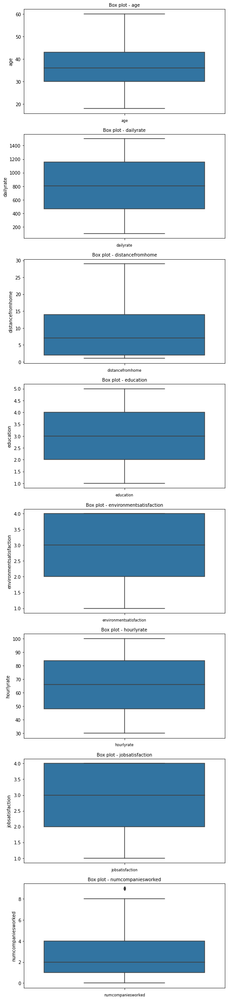

In [ ]:
# finding the outliers of the variables using boxplot

col_names = ['age', 'dailyrate', 'distancefromhome', 'education', 'environmentsatisfaction', 'hourlyrate', 'jobsatisfaction',
             'numcompaniesworked']

fig, ax = plt.subplots(len(col_names), figsize= (8,40))

for i, col_val in enumerate(col_names):
  sns.boxplot(y = df[col_val], ax= ax[i])
  ax[i].set_title('Box plot - {}'.format(col_val), fontsize= 10)
  ax[i].set_xlabel(col_val, fontsize= 8)
plt.show()

# we have outliers in number of companies worked, perfomance rating, total working years and training time last year.

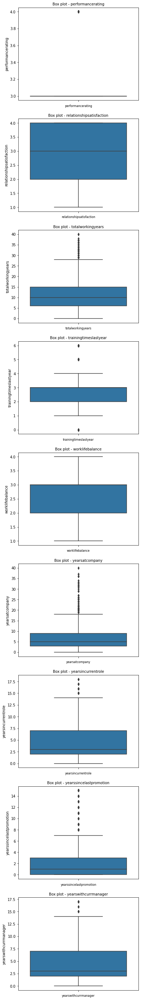

In [ ]:
col_names = ['performancerating', 'relationshipsatisfaction', 'totalworkingyears', 'trainingtimeslastyear', 'worklifebalance',
             'yearsatcompany', 'yearsincurrentrole', 'yearssincelastpromotion', 'yearswithcurrmanager']

fig, ax = plt.subplots(len(col_names), figsize= (6,50))

for i, col_val in enumerate(col_names):
  sns.boxplot(y = df[col_val], ax= ax[i])
  ax[i].set_title('Box plot - {}'.format(col_val), fontsize= 10)
  ax[i].set_xlabel(col_val, fontsize= 8)
plt.show()

# Outliers also in performance rating, total working years and training times last year, yearsatcompany, yearsincurrentrole,
# yearssincelastpromotion and yearswithcurrmanager

In [ ]:
# checking for anormalities
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)

IQR = Q3 - Q1
IQR
lower_bound = Q1 - (1.5*IQR)
upper_bound = Q3 + (1.5*IQR)

print('Lower_Bound' +str(lower_bound))
print('Upper_Bound' +str(upper_bound))

Lower_Boundage                           10.500
dailyrate                   -573.000
distancefromhome             -16.000
education                     -1.000
environmentsatisfaction       -1.000
hourlyrate                    -5.625
jobinvolvement                 0.500
joblevel                      -2.000
jobsatisfaction               -1.000
monthlyincome              -5291.000
numcompaniesworked            -3.500
percentsalaryhike              3.000
performancerating              3.000
relationshipsatisfaction      -1.000
stockoptionlevel              -1.500
totalworkingyears             -7.500
trainingtimeslastyear          0.500
worklifebalance                0.500
yearsatcompany                -6.000
yearsincurrentrole            -5.500
yearssincelastpromotion       -4.500
yearswithcurrmanager          -5.500
dtype: float64
Upper_Boundage                            62.500
dailyrate                    2195.000
distancefromhome               32.000
education                       7.0

In [ ]:
# Removing the outliers

df1 = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]
df1.head()

,age,attrition,businesstravel,dailyrate,department,distancefromhome,education,educationfield,environmentsatisfaction,gender,hourlyrate,jobinvolvement,joblevel,jobrole,jobsatisfaction,maritalstatus,monthlyincome,numcompaniesworked,overtime,percentsalaryhike,performancerating,relationshipsatisfaction,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,1,Yes,11,3,3,0,8,3,3,8,7,3,0
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,4,Male,79,3,1,Laboratory Technician,4,Single,3068,0,No,13,3,3,0,8,2,2,7,7,3,6
9,36,No,Travel_Rarely,1299,Research & Development,27,3,Medical,3,Male,94,3,2,Healthcare Representative,3,Married,5237,6,No,13,3,2,2,17,3,2,7,7,7,7
11,29,No,Travel_Rarely,153,Research & Development,15,2,Life Sciences,4,Female,49,2,2,Laboratory Technician,3,Single,4193,0,Yes,12,3,4,0,10,3,3,9,5,0,8


In [ ]:
# Getting the size of our data set after removing the outliers
df1.shape

# Afer removing the outliers we remain with 863 rows.

(779, 30)

In [ ]:
# Removing the outliers will remove alot of data, therefore, we will keep the outliers.
# Furthermore, these outliers seem to be more of a distribution pattern rather than from errors

df.shape


(1470, 30)

### b) Categorical Analysis

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 30 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   age                       1470 non-null   int64 
 1   attrition                 1470 non-null   object
 2   businesstravel            1470 non-null   object
 3   dailyrate                 1470 non-null   int64 
 4   department                1470 non-null   object
 5   distancefromhome          1470 non-null   int64 
 6   education                 1470 non-null   int64 
 7   educationfield            1470 non-null   object
 8   environmentsatisfaction   1470 non-null   int64 
 9   gender                    1470 non-null   object
 10  hourlyrate                1470 non-null   int64 
 11  jobinvolvement            1470 non-null   int64 
 12  joblevel                  1470 non-null   int64 
 13  jobrole                   1470 non-null   object
 14  jobsatisfaction         

Text(0.5, 1.0, 'Travel Type')

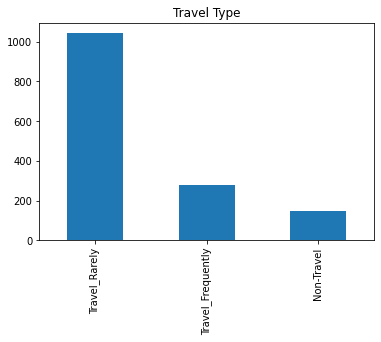

In [ ]:
# Bar graph showing travel to work place

df.businesstravel.value_counts().plot.bar()
plt.title('Travel Type')
# most of the employees rarely travel to work

Text(0.5, 1.0, 'Left/Retained in the Company')

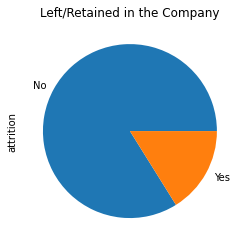

In [ ]:
# Piechart showing attrition of the employees

df.attrition.value_counts().plot(kind= 'pie')
plt.title('Left/Retained in the Company')

# Although most of the employees stay in the company a certain number of the employees leave the company

Text(0.5, 1.0, 'Field of Study')

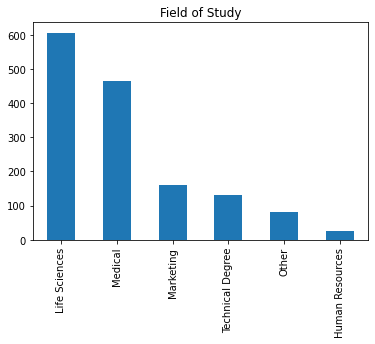

In [ ]:
# bar chart showing field of study of the employees

df.educationfield.value_counts().plot.bar()
plt.title('Field of Study')

# most of the employees are in the field of life sciences and the least in the human resources

Text(0.5, 1.0, 'Gender')

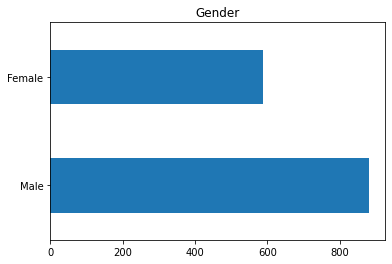

In [ ]:
# bar chart showing male and female workers in the compony

df.gender.value_counts().plot(kind= 'barh')
plt.title('Gender')
# over 50% of the workers are male employees

Text(0.5, 1.0, 'Role in the company')

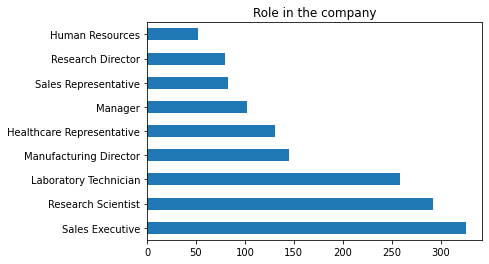

In [ ]:
# barh chart showing role of the employees in the company

df.jobrole.value_counts().plot(kind= 'barh')
plt.title('Role in the company')

# most of the employees are in sales exrcutives, research scientists and laboratory technicians

Text(0.5, 1.0, 'Marital Status')

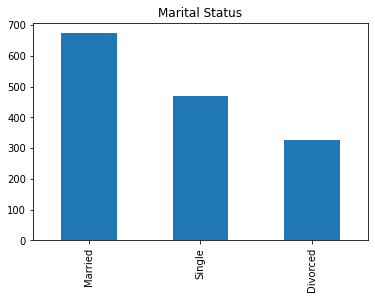

In [ ]:
# bar chart of the marital status

df.maritalstatus.value_counts().plot.bar()
plt.title('Marital Status')

# most of the employees are married

Text(0.5, 1.0, 'Work Beyond Set Hours')

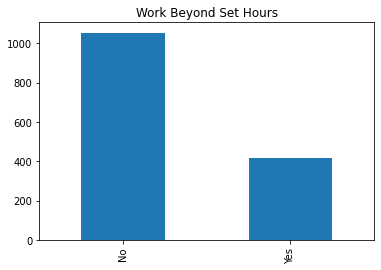

In [ ]:
# bar chart showing employees working overtime

df.overtime.value_counts().plot.bar()
plt.title('Work Beyond Set Hours')

# most of the employees do not work overtime

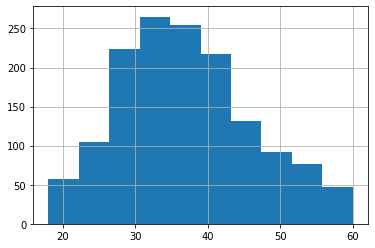

In [ ]:
# histogram showing the age distribtion

df['age'].hist()

# most of the employees are of the age between 30 and 40.

### c) Summary Statistics

In [ ]:
df.describe(include= 'all')

,age,attrition,businesstravel,dailyrate,department,distancefromhome,education,educationfield,environmentsatisfaction,gender,hourlyrate,jobinvolvement,joblevel,jobrole,jobsatisfaction,maritalstatus,monthlyincome,numcompaniesworked,overtime,percentsalaryhike,performancerating,relationshipsatisfaction,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager
count,1470.000000,1470,1470,1470.000000,1470,1470.000000,1470.000000,1470,1470.000000,1470,1470.000000,1470.000000,1470.000000,1470,1470.000000,1470,1470.000000,1470.000000,1470,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
unique,NaN,2,3,NaN,3,NaN,NaN,6,NaN,2,NaN,NaN,NaN,9,NaN,3,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,No,Travel_Rarely,NaN,Research & Development,NaN,NaN,Life Sciences,NaN,Male,NaN,NaN,NaN,Sales Executive,NaN,Married,NaN,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,1233,1043,NaN,961,NaN,NaN,606,NaN,882,NaN,NaN,NaN,326,NaN,673,NaN,NaN,1054,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,36.923810,NaN,NaN,802.485714,NaN,9.192517,2.912925,NaN,2.721769,NaN,65.891156,2.729932,2.063946,NaN,2.728571,NaN,6502.931293,2.693197,NaN,15.209524,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,NaN,NaN,403.509100,NaN,8.106864,1.024165,NaN,1.093082,NaN,20.329428,0.711561,1.106940,NaN,1.102846,NaN,4707.956783,2.498009,NaN,3.659938,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,NaN,NaN,102.000000,NaN,1.000000,1.000000,NaN,1.000000,NaN,30.000000,1.000000,1.000000,NaN,1.000000,NaN,1009.000000,0.000000,NaN,11.000000,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,NaN,NaN,465.000000,NaN,2.000000,2.000000,NaN,2.000000,NaN,48.000000,2.000000,1.000000,NaN,2.000000,NaN,2911.000000,1.000000,NaN,12.000000,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,NaN,NaN,802.000000,NaN,7.000000,3.000000,NaN,3.000000,NaN,66.000000,3.000000,2.000000,NaN,3.000000,NaN,4919.000000,2.000000,NaN,14.000000,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,NaN,NaN,1157.000000,NaN,14.000000,4.000000,NaN,4.000000,NaN,83.750000,3.000000,3.000000,NaN,4.000000,NaN,8379.000000,4.000000,NaN,18.000000,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000


In [ ]:
# calculating the mean of the dataset

df.mean()

age                           36.923810
dailyrate                    802.485714
distancefromhome               9.192517
education                      2.912925
environmentsatisfaction        2.721769
hourlyrate                    65.891156
jobinvolvement                 2.729932
joblevel                       2.063946
jobsatisfaction                2.728571
monthlyincome               6502.931293
numcompaniesworked             2.693197
percentsalaryhike             15.209524
performancerating              3.153741
relationshipsatisfaction       2.712245
stockoptionlevel               0.793878
totalworkingyears             11.279592
trainingtimeslastyear          2.799320
worklifebalance                2.761224
yearsatcompany                 7.008163
yearsincurrentrole             4.229252
yearssincelastpromotion        2.187755
yearswithcurrmanager           4.123129
dtype: float64

In [ ]:
# calculating the median of the dataset

df.median()

age                           36.0
dailyrate                    802.0
distancefromhome               7.0
education                      3.0
environmentsatisfaction        3.0
hourlyrate                    66.0
jobinvolvement                 3.0
joblevel                       2.0
jobsatisfaction                3.0
monthlyincome               4919.0
numcompaniesworked             2.0
percentsalaryhike             14.0
performancerating              3.0
relationshipsatisfaction       3.0
stockoptionlevel               1.0
totalworkingyears             10.0
trainingtimeslastyear          3.0
worklifebalance                3.0
yearsatcompany                 5.0
yearsincurrentrole             3.0
yearssincelastpromotion        1.0
yearswithcurrmanager           3.0
dtype: float64

In [ ]:
# Finding the standard deviation 

df.std()

# The standard deviations shows the ranges, in that the values with more range show higher
# values of standard deviation, meaning the data is more spread away from the mean.

age                            9.135373
dailyrate                    403.509100
distancefromhome               8.106864
education                      1.024165
environmentsatisfaction        1.093082
hourlyrate                    20.329428
jobinvolvement                 0.711561
joblevel                       1.106940
jobsatisfaction                1.102846
monthlyincome               4707.956783
numcompaniesworked             2.498009
percentsalaryhike              3.659938
performancerating              0.360824
relationshipsatisfaction       1.081209
stockoptionlevel               0.852077
totalworkingyears              7.780782
trainingtimeslastyear          1.289271
worklifebalance                0.706476
yearsatcompany                 6.126525
yearsincurrentrole             3.623137
yearssincelastpromotion        3.222430
yearswithcurrmanager           3.568136
dtype: float64

In [ ]:
# finding the variance 

df.var()

age                         8.345505e+01
dailyrate                   1.628196e+05
distancefromhome            6.572125e+01
education                   1.048914e+00
environmentsatisfaction     1.194829e+00
hourlyrate                  4.132856e+02
jobinvolvement              5.063193e-01
joblevel                    1.225316e+00
jobsatisfaction             1.216270e+00
monthlyincome               2.216486e+07
numcompaniesworked          6.240049e+00
percentsalaryhike           1.339514e+01
performancerating           1.301936e-01
relationshipsatisfaction    1.169013e+00
stockoptionlevel            7.260346e-01
totalworkingyears           6.054056e+01
trainingtimeslastyear       1.662219e+00
worklifebalance             4.991081e-01
yearsatcompany              3.753431e+01
yearsincurrentrole          1.312712e+01
yearssincelastpromotion     1.038406e+01
yearswithcurrmanager        1.273160e+01
dtype: float64

In [ ]:
# finding the skewness 

df.skew()

# most the dataset is negatively skewed
# some of the data is left skewed and posive skew reflect the positively skewed data

age                         0.413286
dailyrate                  -0.003519
distancefromhome            0.958118
education                  -0.289681
environmentsatisfaction    -0.321654
hourlyrate                 -0.032311
jobinvolvement             -0.498419
joblevel                    1.025401
jobsatisfaction            -0.329672
monthlyincome               1.369817
numcompaniesworked          1.026471
percentsalaryhike           0.821128
performancerating           1.921883
relationshipsatisfaction   -0.302828
stockoptionlevel            0.968980
totalworkingyears           1.117172
trainingtimeslastyear       0.553124
worklifebalance            -0.552480
yearsatcompany              1.764529
yearsincurrentrole          0.917363
yearssincelastpromotion     1.984290
yearswithcurrmanager        0.833451
dtype: float64

In [ ]:
# finding the kurtosis of the dataset

df.kurt()

# The data has negative kurtosis indicating that the distribution has tails 
# these means that our outliers are less extreme in these columns but data comes from normal detribution
# we have some positve kurtosis meaning the data has extreme outliers

age                        -0.404145
dailyrate                  -1.203823
distancefromhome           -0.224833
education                  -0.559115
environmentsatisfaction    -1.202521
hourlyrate                 -1.196398
jobinvolvement              0.270999
joblevel                    0.399152
jobsatisfaction            -1.222193
monthlyincome               1.005233
numcompaniesworked          0.010214
percentsalaryhike          -0.300598
performancerating           1.695939
relationshipsatisfaction   -1.184814
stockoptionlevel            0.364634
totalworkingyears           0.918270
trainingtimeslastyear       0.494993
worklifebalance             0.419460
yearsatcompany              3.935509
yearsincurrentrole          0.477421
yearssincelastpromotion     3.612673
yearswithcurrmanager        0.171058
dtype: float64

In [ ]:
# df.attrition.replace(to_replace=[0, 1], value=['no', 'yes'])

#df['attrition'] = df['attrition'].astype('category')

#from sklearn.preprocessing import LabelEncoder

#labelencoder = LabelEncoder()

#df['attrition'] = labelencoder.fit_transform(df['attrition'])
#,df['attrition']

# BIVARIATE ANALYSIS

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 30 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   age                       1470 non-null   int64 
 1   attrition                 1470 non-null   object
 2   businesstravel            1470 non-null   object
 3   dailyrate                 1470 non-null   int64 
 4   department                1470 non-null   object
 5   distancefromhome          1470 non-null   int64 
 6   education                 1470 non-null   int64 
 7   educationfield            1470 non-null   object
 8   environmentsatisfaction   1470 non-null   int64 
 9   gender                    1470 non-null   object
 10  hourlyrate                1470 non-null   int64 
 11  jobinvolvement            1470 non-null   int64 
 12  joblevel                  1470 non-null   int64 
 13  jobrole                   1470 non-null   object
 14  jobsatisfaction         

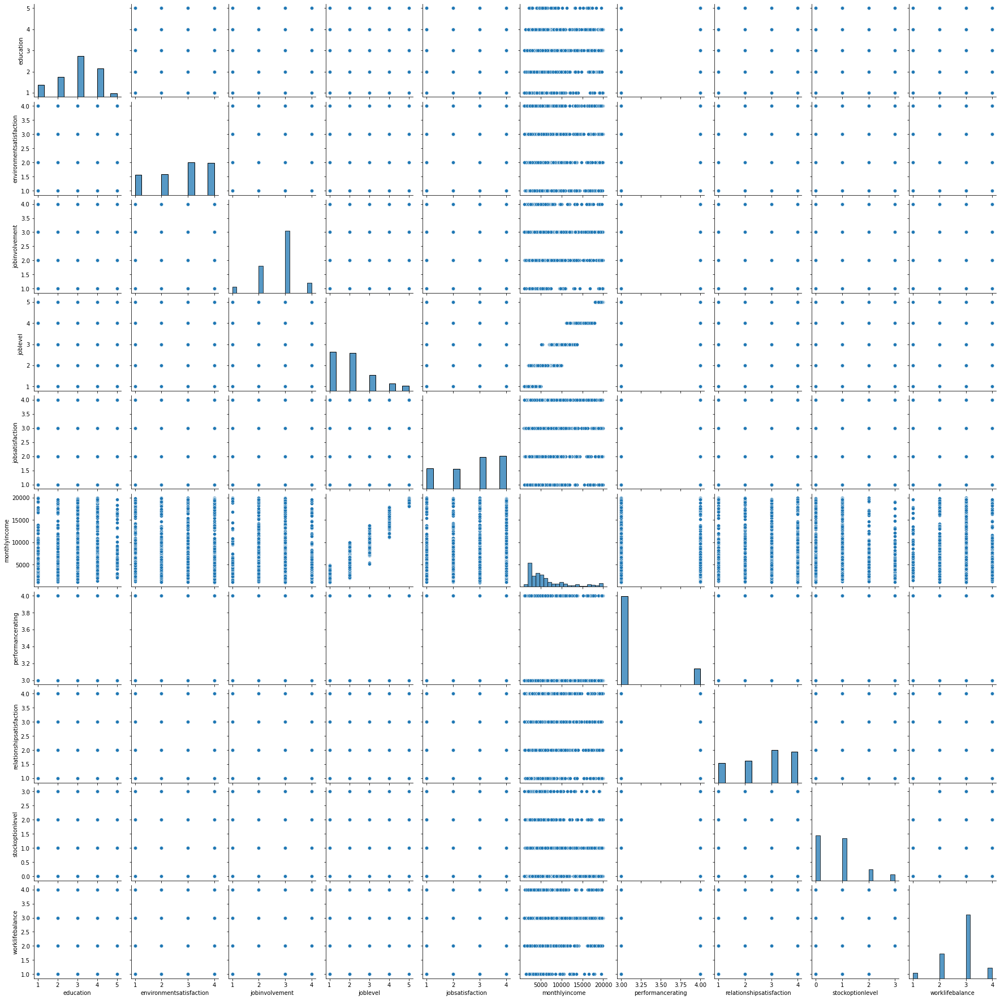

In [ ]:
Profile_relation = df.drop(['age', 'dailyrate', 'distancefromhome', 'hourlyrate', 'numcompaniesworked',
                            'percentsalaryhike', 'totalworkingyears', 'trainingtimeslastyear', 'yearsatcompany',
                            'yearsincurrentrole', 'yearssincelastpromotion', 'yearswithcurrmanager'], axis=1)
sns.pairplot(Profile_relation)
plt.show()

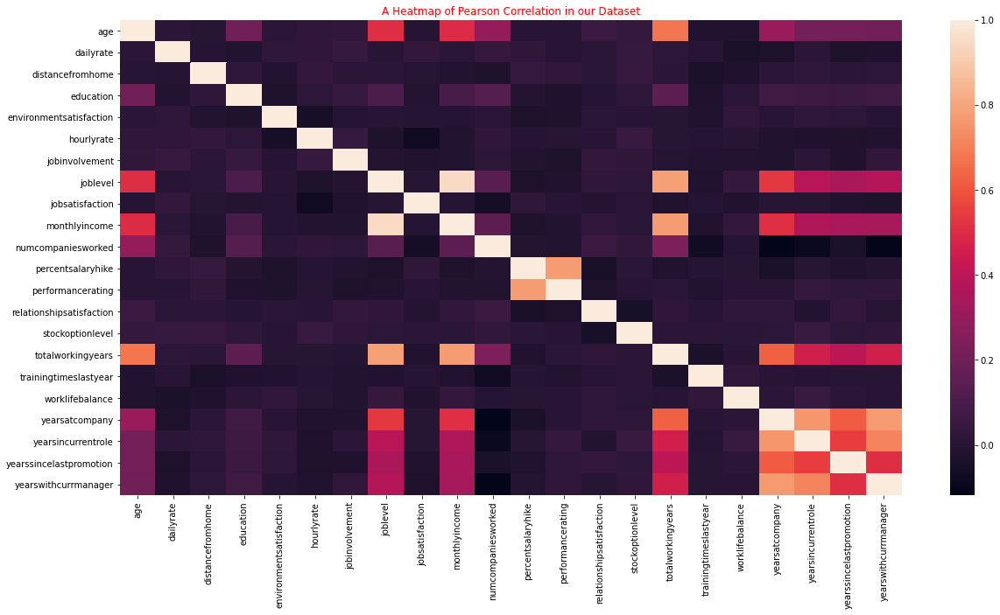

In [ ]:
# Calculating the pearson coefficient correlation
plt.figure(figsize = (20,10))
sns.heatmap(df.corr(),annot=False)
plt.title('A Heatmap of Pearson Correlation in our Dataset', color='red')
plt.show()



# BIVARIATE ANALYSIS RECOMMENDATION

From the Bivariate Analysis and the Profile Report, the columns found to have some correlation were:
Attrition,
BusinessTravel,
Department,
Education,
EducationField,
EnvironmentSatisfaction,
Gender,
JobInvolvement,
JobLevel,
JobRole,
JobSatisfaction,
MaritalStatus,
MonthlyIncome,
OverTime,
PerformanceRating,
RelationshipSatisfaction,
StockOptionLevel and
WorkLifeBalance

# MULTIVARIATE ANALYSIS

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 30 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   age                       1470 non-null   int64 
 1   attrition                 1470 non-null   object
 2   businesstravel            1470 non-null   object
 3   dailyrate                 1470 non-null   int64 
 4   department                1470 non-null   object
 5   distancefromhome          1470 non-null   int64 
 6   education                 1470 non-null   int64 
 7   educationfield            1470 non-null   object
 8   environmentsatisfaction   1470 non-null   int64 
 9   gender                    1470 non-null   object
 10  hourlyrate                1470 non-null   int64 
 11  jobinvolvement            1470 non-null   int64 
 12  joblevel                  1470 non-null   int64 
 13  jobrole                   1470 non-null   object
 14  jobsatisfaction         

## Principal Component Analysis (PCA)

In [ ]:
df_pca = df.copy(deep=True)

In [ ]:
# Data for label encoding
df_pca['businesstravel'] = df_pca['businesstravel'].astype('category')
df_pca['department'] = df_pca['department'].astype('category')
df_pca['educationfield'] = df_pca['educationfield'].astype('category')
df_pca['gender'] = df_pca['gender'].astype('category')
df_pca['jobrole'] = df_pca['jobrole'].astype('category')
df_pca['maritalstatus'] = df_pca['maritalstatus'].astype('category')
df_pca['overtime'] = df_pca['overtime'].astype('category')

In [ ]:
# Label encoding the categorical data

from sklearn.preprocessing import LabelEncoder

labelencoder = LabelEncoder()

df_pca['businesstravel'] = labelencoder.fit_transform(df_pca['businesstravel'])
df_pca['department'] = labelencoder.fit_transform(df_pca['department'])
df_pca['educationfield'] = labelencoder.fit_transform(df_pca['educationfield'])
df_pca['gender'] = labelencoder.fit_transform(df_pca['gender'])
df_pca['jobrole'] = labelencoder.fit_transform(df_pca['jobrole'])
df_pca['maritalstatus'] = labelencoder.fit_transform(df_pca['maritalstatus'])
df_pca['overtime'] = labelencoder.fit_transform(df_pca['overtime'])

In [ ]:
x = df_pca.drop(['attrition'], axis= 1) # features
y = df_pca['attrition'] #target variable

In [ ]:
# Splitting the data into train and test sets

from sklearn.model_selection import  train_test_split

x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=0)

In [ ]:
# Performing standard scalar normalization to normalize our feature set.

from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
x_train =sc.fit_transform(x_train)
x_test = sc.transform (x_test)

In [ ]:
# Applying PCA
# We did not specify the number of components in the constructor. 
# Hence, the features in Financial_encoding set will be returned for both the training and test sets.

from sklearn.decomposition import PCA

pca = PCA()
X_train = pca.fit_transform(x_train)
X_test = pca.transform(x_test)

In [ ]:
# Explained Variance Ratio

explained_variance = pca.explained_variance_ratio_
explained_variance

array([0.16263726, 0.06638758, 0.0632505 , 0.05726161, 0.05424401,
       0.04109107, 0.04023643, 0.03870811, 0.03696792, 0.03595021,
       0.03544304, 0.03428372, 0.03349319, 0.03296051, 0.03252002,
       0.0310185 , 0.03065031, 0.02997541, 0.02904989, 0.02515736,
       0.01858924, 0.01710184, 0.01111945, 0.01102541, 0.01001669,
       0.00774235, 0.00679777, 0.00470673, 0.00161385])

In [ ]:
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 29 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   age                       1470 non-null   int64
 1   businesstravel            1470 non-null   int64
 2   dailyrate                 1470 non-null   int64
 3   department                1470 non-null   int64
 4   distancefromhome          1470 non-null   int64
 5   education                 1470 non-null   int64
 6   educationfield            1470 non-null   int64
 7   environmentsatisfaction   1470 non-null   int64
 8   gender                    1470 non-null   int64
 9   hourlyrate                1470 non-null   int64
 10  jobinvolvement            1470 non-null   int64
 11  joblevel                  1470 non-null   int64
 12  jobrole                   1470 non-null   int64
 13  jobsatisfaction           1470 non-null   int64
 14  maritalstatus             1470 non-null 

In [ ]:
x.columns

Index(['age', 'businesstravel', 'dailyrate', 'department', 'distancefromhome',
       'education', 'educationfield', 'environmentsatisfaction', 'gender',
       'hourlyrate', 'jobinvolvement', 'joblevel', 'jobrole',
       'jobsatisfaction', 'maritalstatus', 'monthlyincome',
       'numcompaniesworked', 'overtime', 'percentsalaryhike',
       'performancerating', 'relationshipsatisfaction', 'stockoptionlevel',
       'totalworkingyears', 'trainingtimeslastyear', 'worklifebalance',
       'yearsatcompany', 'yearsincurrentrole', 'yearssincelastpromotion',
       'yearswithcurrmanager'],
      dtype='object')

In [ ]:
# The explained variance ratio is the percentage of variance that is attributed by each of the selected components. 
# Ideally, you would choose the number of components to include in your model by adding the explained variance ratio 
# of each component until you reach a total of around 0.8 or 80% to avoid overfitting.

first_17 = [0.16263726 +0.06638758 + 0.0632505 + 0.05726161+ 0.05424401+ 0.04109107+ 0.04023643+ 
         0.03870811+0.03696792+ 0.03595021+0.03544304+0.03428372+ 0.03349319+ 0.03296051+ 
         0.03252002+0.0310185+ 0.03065031]

first_17
# This suggests that the first 17 indicate the most determining features to attrition i.e. index 0 to 16 of x.info()

[0.8271039899999999]

# MULTIVARIATE ANALYSIS RECOMMENDATION

From the Multivariate Analysis, using principal component analysis with a cut-off point of 80%, as is the standard recommendation, the columns found to have some correlation were:

‘age','businesstravel', 'dailyrate', 'department', 'distancefromhome',
       'education', 'educationfield', 'environmentsatisfaction', 'gender',
       'hourlyrate', 'jobinvolvement', 'joblevel', 'jobrole',
       'jobsatisfaction', 'maritalstatus', 'monthlyincome',
       'Numcompaniesworked'

# Exploratory Data Analysis
Considering the features found with correlation in Bivariate and those found important in Multivariate Analysis with the Target Variable being Attrition, the features to analyze are: 
BusinessTravel,
Department,
Education,
EducationField,
EnvironmentSatisfaction,
Gender,
JobInvolvement,
JobLevel,
JobRole,
JobSatisfaction,
MaritalStatus and
MonthlyIncome

We will however drop Education, EducationField, JobInvolvement and JobRole since they are ordinal with no explanation what their values stand for. We will group them in terms of PerformanceRating where possible to give more insight into the data.

### How Does Business Travel affect Attrition considering Employee Performance

In [ ]:
# Business Travel

Travel = df.groupby(['performancerating','attrition'], group_keys=True, as_index=False).apply(lambda x:x.businesstravel.value_counts())
Travel

businesstravel,performancerating,attrition,Travel_Rarely,Travel_Frequently,Non-Travel
0,3,No,755,173,116
1,3,Yes,134,58,8
2,4,No,132,35,22
3,4,Yes,22,11,4


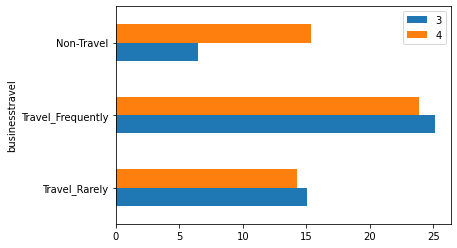

In [ ]:
Travel_Attrition_3 = (Travel.iloc[1, 2:] / (Travel.iloc[1, 2:] + Travel.iloc[0,2:]))*100 
                      

Travel_Attrition_4 = (Travel.iloc[3, 2:] / (Travel.iloc[2, 2:] + Travel.iloc[3, 2:]))*100

Travel_Attrition_3 = Travel_Attrition_3.to_frame()
Travel_Attrition_4 = Travel_Attrition_4.to_frame()
Travel_Attrition = pd.concat([Travel_Attrition_3,Travel_Attrition_4], axis=1)
Travel_Attrition.columns = ['3','4']
Travel_Attrition.plot.barh()

Employees who travelled frequently experienced higher attrition rates in general (about 25%). This could be caused by experiencing different cultures that widen their view of the world and the workplace, thereby challenging them to change their job to fit the new mold they are molding their habits into. Employees who did not travel and had a lower performance ranking (3) had the least attrition (about 6%) and this could be due to content in the workplace due to the lack of an outside view of work from different areas and cultures.

### How Does Department affect Attrition considering Employee Performance

In [ ]:
# Department

Department = df.groupby(['performancerating','attrition'], group_keys=True, as_index=False).apply(lambda x:x.department.value_counts())
Department

department,performancerating,attrition,Research & Development,Sales,Human Resources
0,3,No,698,303,43
1,3,Yes,107,82,11
2,4,No,130,51,8
3,4,Yes,26,10,1


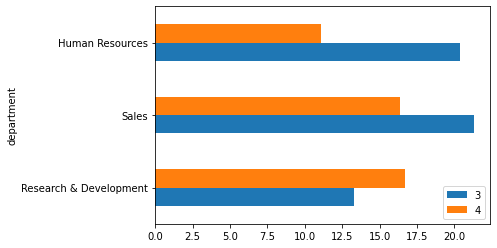

In [ ]:
Department_Attrition_3 = (Department.iloc[1, 2:] / (Department.iloc[1, 2:] + Department.iloc[0,2:]))*100 
                      

Department_Attrition_4 = (Department.iloc[3, 2:] / (Department.iloc[2, 2:] + Department.iloc[3, 2:]))*100

Department_Attrition_3 = Department_Attrition_3.to_frame()
Department_Attrition_4 = Department_Attrition_4.to_frame()
Department_Attrition = pd.concat([Department_Attrition_3,Department_Attrition_4], axis=1)
Department_Attrition.columns = ['3','4']
Department_Attrition.plot.barh()

Employees with performance rank 3 showed high attrition rates in the Human Resources (20%) and Sales (23%) departments. These are less technical departments. Those with rank 4 had the highest attrition in Sales and Research & Development departments (17%). Research and Development is more technical.

### How Does Environment Satisfaction affect Attrition considering Employee Performance

In [ ]:
# Environment Satisfaction

environment = df.groupby(['performancerating','attrition'], 
                         group_keys=True, as_index=True).apply(lambda x:x.environmentsatisfaction.value_counts()).reset_index()
environment

,performancerating,attrition,level_2,environmentsatisfaction
0,3,No,4,334
1,3,No,3,329
2,3,No,2,206
3,3,No,1,175
4,3,Yes,1,59
5,3,Yes,3,52
6,3,Yes,4,50
7,3,Yes,2,39
8,4,No,3,62
9,4,No,4,52


In [ ]:
enva_4 = environment[environment.level_2 == 4]
enva_4_group_3 = (enva_4.iloc[1,3] / (enva_4.iloc[0,3]+enva_4.iloc[1,3]))*100
enva_4_group_4 = (enva_4.iloc[3,3] / (enva_4.iloc[2,3]+enva_4.iloc[3,3]))*100

enva_3 = environment[environment.level_2 == 3]
enva_3_group_3 = (enva_3.iloc[1,3] / (enva_3.iloc[0,3]+enva_3.iloc[1,3]))*100
enva_3_group_4 = (enva_3.iloc[3,3] / (enva_3.iloc[2,3]+enva_3.iloc[3,3]))*100

enva_2 = environment[environment.level_2 == 2]
enva_2_group_3 = (enva_2.iloc[1,3] / (enva_2.iloc[0,3]+enva_2.iloc[1,3]))*100
enva_2_group_4 = (enva_2.iloc[3,3] / (enva_2.iloc[2,3]+enva_2.iloc[3,3]))*100

enva_1 = environment[environment.level_2 == 1]
enva_1_group_3 = (enva_1.iloc[1,3] / (enva_1.iloc[0,3]+enva_1.iloc[1,3]))*100
enva_1_group_4 = (enva_1.iloc[3,3] / (enva_1.iloc[2,3]+enva_1.iloc[3,3]))*100

enva_dict = { 'percentage': [enva_4_group_3,enva_4_group_4,enva_3_group_3,enva_3_group_4,
                             enva_2_group_3,enva_2_group_4,enva_1_group_3,enva_1_group_4],
}
enva_df = pd.DataFrame(enva_dict, index= ['Perf_3_Env_4','Perf_4_Env_4','Perf_3_Env_3','Perf_4_Env_3','Perf_3_Env_2',
                        'Perf_4_Env_2','Perf_3_Env_1','Perf_4_Env_1'] )
enva_df

,percentage
Perf_3_Env_4,13.020833
Perf_4_Env_4,16.129032
Perf_3_Env_3,13.648294
Perf_4_Env_3,13.888889
Perf_3_Env_2,15.918367
Perf_4_Env_2,9.523810
Perf_3_Env_1,25.213675
Perf_4_Env_1,26.000000


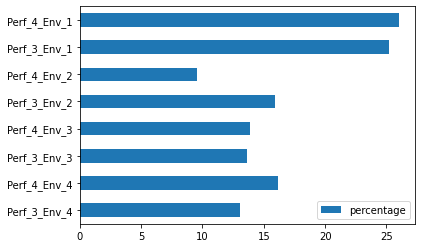

In [ ]:
# Perf_4_Env_1 stands for Performance Rating is 4 and Environment Satisfaction is 1. 
# Perf_4_Env_2 stands for Performance Rating is 4 and Environment Satisfaction is 2.
# Perf_3_Env_1 stands for Performance Rating is 3 and Environment Satisfaction is 1. 
# Perf_3_Env_2 stands for Performance Rating is 3 and Environment Satisfaction is 2.
# and so on...

enva_df.plot.barh()

Both performance rating groups i.e. 3 and 4, had high attrition rates (25%) if their environment satisfaction was low i.e. 1. This could be dissatisfaction with their work environment including the work atmosphere of the workplace, compared to their performance.

### How Does Gender affect Attrition considering Employee Performance

In [ ]:
# Gender

Gender = df.groupby(['performancerating','attrition'], group_keys=True, as_index=False).apply(lambda x:x.gender.value_counts())
Gender

gender,performancerating,attrition,Male,Female
0,3,No,622,422
1,3,Yes,128,72
2,4,No,110,79
3,4,Yes,22,15


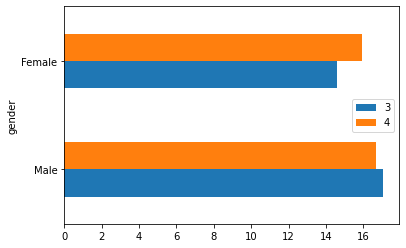

In [ ]:
Gender_Attrition_3 = (Gender.iloc[1, 2:] / (Gender.iloc[1, 2:] + Gender.iloc[0,2:]))*100 
                      

Gender_Attrition_4 = (Gender.iloc[3, 2:] / (Gender.iloc[2, 2:] + Gender.iloc[3, 2:]))*100

Gender_Attrition_3 = Gender_Attrition_3.to_frame()
Gender_Attrition_4 = Gender_Attrition_4.to_frame()
Gender_Attrition = pd.concat([Gender_Attrition_3,Gender_Attrition_4], axis=1)
Gender_Attrition.columns = ['3','4']
Gender_Attrition.plot.barh()

Males generally had more attrition rates, although only 1-2% more than the females.

### How Does Job Satisfaction affect Attrition considering Employee Performance

In [ ]:
# Job Satisfaction

job = df.groupby(['performancerating','attrition'], 
                         group_keys=True, as_index=True).apply(lambda x:x.jobsatisfaction.value_counts()).reset_index()
job

,performancerating,attrition,level_2,jobsatisfaction
0,3,No,4,335
1,3,No,3,319
2,3,No,2,199
3,3,No,1,191
4,3,Yes,3,67
5,3,Yes,1,50
6,3,Yes,4,45
7,3,Yes,2,38
8,4,No,4,72
9,4,No,3,50


In [ ]:
job_4 = job[job.level_2 == 4]
job_4_group_3 = (job_4.iloc[1,3] / (job_4.iloc[0,3]+job_4.iloc[1,3]))*100
job_4_group_4 = (job_4.iloc[3,3] / (job_4.iloc[2,3]+job_4.iloc[3,3]))*100

job_3 = job[job.level_2 == 3]
job_3_group_3 = (job_3.iloc[1,3] / (job_3.iloc[0,3]+job_3.iloc[1,3]))*100
job_3_group_4 = (job_3.iloc[3,3] / (job_3.iloc[2,3]+job_3.iloc[3,3]))*100

job_2 = job[job.level_2 == 2]
job_2_group_3 = (job_2.iloc[1,3] / (job_2.iloc[0,3]+job_2.iloc[1,3]))*100
job_2_group_4 = (job_2.iloc[3,3] / (job_2.iloc[2,3]+job_2.iloc[3,3]))*100

job_1 = job[job.level_2 == 1]
job_1_group_3 = (job_1.iloc[1,3] / (job_1.iloc[0,3]+job_1.iloc[1,3]))*100
job_1_group_4 = (job_1.iloc[3,3] / (job_1.iloc[2,3]+job_1.iloc[3,3]))*100

job_dict = { 'percentage': [job_4_group_3,job_4_group_4,job_3_group_3,job_3_group_4,
                             job_2_group_3,job_2_group_4,job_1_group_3,job_1_group_4],
}
job_df = pd.DataFrame(job_dict, index= ['Perf_3_job_4','Perf_4_job_4','Perf_3_job_3','Perf_4_job_3','Perf_3_job_2',
                        'Perf_4_job_2','Perf_3_job_1','Perf_4_job_1'] )
job_df

,percentage
Perf_3_job_4,11.842105
Perf_4_job_4,8.860759
Perf_3_job_3,17.357513
Perf_4_job_3,10.714286
Perf_3_job_2,16.033755
Perf_4_job_2,18.604651
Perf_3_job_1,20.746888
Perf_4_job_1,33.333333


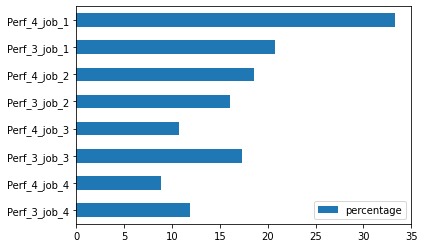

In [ ]:
# Perf_4_job_1 stands for Performance Rating is 4 and Job Satisfaction is 1. 
# Perf_4_job_2 stands for Performance Rating is 4 and Job Satisfaction is 2.
# Perf_3_job_1 stands for Performance Rating is 3 and Job Satisfaction is 1. 
# Perf_3_job_2 stands for Performance Rating is 3 and Job Satisfaction is 2.
# and so on...

job_df.plot.barh()

Performance rating group 4 had high attrition rates (25%) if the job satisfaction was low i.e. 1. This could be dissatisfaction with their day to day activities including compared to their performance. Whereas those in group 4 with high job satisfaction i.e. 4 having the least attrition at 7% indicating relative contentment with their day to day activities including compared to their performance.

### How Does Marital Status affect Attrition considering Employee Performance

In [ ]:
# Marital Status
Marital = df.groupby(['performancerating','attrition'], group_keys=True, as_index=True).apply(lambda x:x.maritalstatus.value_counts()).reset_index()
Marital

,performancerating,attrition,level_2,maritalstatus
0,3,No,Married,490
1,3,No,Single,303
2,3,No,Divorced,251
3,3,Yes,Single,95
4,3,Yes,Married,77
5,3,Yes,Divorced,28
6,4,No,Married,99
7,4,No,Single,47
8,4,No,Divorced,43
9,4,Yes,Single,25


In [ ]:
Marital_Married_3 = Marital[(Marital.performancerating == 3) & (Marital.level_2 == 'Married')]
Marital_Married_3_Attrition = (Marital_Married_3.iloc[1,3] / (Marital_Married_3.iloc[1,3]+ Marital_Married_3.iloc[0,3]))*100

Marital_Married_4 = Marital[(Marital.performancerating == 4) & (Marital.level_2 == 'Married')]
Marital_Married_4_Attrition = (Marital_Married_4.iloc[1,3] / (Marital_Married_4.iloc[1,3]+ Marital_Married_4.iloc[0,3]))*100

Marital_Single_3 = Marital[(Marital.performancerating == 3) & (Marital.level_2 == 'Single')]
Marital_Single_3_Attrition = (Marital_Single_3.iloc[1,3] / (Marital_Single_3.iloc[1,3]+ Marital_Single_3.iloc[0,3]))*100
Marital_Single_3_Attrition

Marital_Single_4 = Marital[(Marital.performancerating == 4) & (Marital.level_2 == 'Single')]
Marital_Single_4_Attrition = (Marital_Single_4.iloc[1,3] / (Marital_Single_4.iloc[1,3]+ Marital_Single_4.iloc[0,3]))*100

Marital_Divorced_3 = Marital[(Marital.performancerating == 3) & (Marital.level_2 == 'Divorced')]
Marital_Divorced_3_Attrition = (Marital_Divorced_3.iloc[1,3] / (Marital_Divorced_3.iloc[1,3]+ Marital_Divorced_3.iloc[0,3]))*100

Marital_Divorced_4 = Marital[(Marital.performancerating == 4) & (Marital.level_2 == 'Divorced')]
Marital_Divorced_4_Attrition = (Marital_Divorced_4.iloc[1,3] / (Marital_Divorced_4.iloc[1,3]+ Marital_Divorced_4.iloc[0,3]))*100
Marital_Divorced_4_Attrition

Marital_dict = { 'percentage': [Marital_Married_3_Attrition,Marital_Married_4_Attrition,Marital_Single_3_Attrition,
                                Marital_Single_4_Attrition,Marital_Divorced_3_Attrition,Marital_Divorced_4_Attrition,]
}

Marital_df = pd.DataFrame(Marital_dict, index= ['Married_3','Married_4','Single_3','Single_4','Divorced_3',
                        'Divorced_4'] )
Marital_df

,percentage
Married_3,13.580247
Married_4,6.603774
Single_3,23.869347
Single_4,34.722222
Divorced_3,10.035842
Divorced_4,10.416667


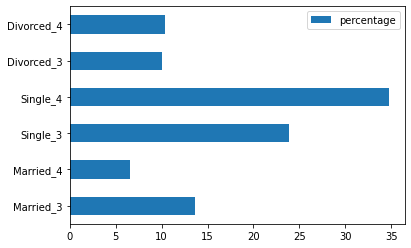

In [ ]:
# Divorced_4 is those Divorced and had the Performance rating of 4
# Divorced_3 is those Divorced and had the Performance rating of 3
# and so on...

Marital_df.plot.barh()

Single people in general had the highest attrition rate with those with a performance rating of 4 having an attrition rate as high as 35%. This could be due to their confidence in their ability to find other jobs as well as the lack of dependents, therefore more risk averse. Married people with performance rating of 4 had the least attrition rate at 6% and could be due to being less risk averse due to them having dependents such as a family.

### How Does Monthly Income affect Attrition

In [ ]:
# Monthly income attrition

Income_Attrition =df.groupby(['monthlyincome','attrition']).apply(lambda x:x['monthlyincome'].count()).reset_index(name='Counts')
Income_Attrition['monthlyincome']=round(Income_Attrition['monthlyincome'],-3)
Income_Attrition=Income_Attrition.groupby(['monthlyincome','attrition']).apply(lambda x:x['monthlyincome'].count()).reset_index(name='Counts')
fig=px.line(Income_Attrition,x='monthlyincome',y='Counts',color='attrition',title='Monthly Income by Number of Employees')
fig.show()

The rate of attrition is highest at the lowest income levels less than 4,000 monthly. The attrition rate decreases with increase in income from around 5,000 monthly, with a minor spike at 10,000 monthly. These individuals represent the midpoint of the payscale and could be looking for better opportunities to earn better from other jobs. The attrition rate flat lines from about 11,000 monthly to 20,000 monthly.

### How Does Age affect Attrition

In [ ]:
Age_Attrition =df.groupby(['age','attrition']).apply(lambda x:x['monthlyincome'].count()).reset_index(name='Counts')
px.line(Age_Attrition,x='age',y='Counts',color='attrition',title='Age by Number of Employees')

The rate of attrition is highest at the lowest income levels less than 4,000 monthly. The attrition rate decreases with increase in income from around 5,000 monthly, with a minor spike at 10,000 monthly. These individuals represent the midpoint of the payscale and could be looking for better opportunities to earn better from other jobs. The attrition rate flat lines from about 11,000 monthly to 20,000 monthly.

## Hypothesis Testing

#### Hypothesis Testing: Is there significant difference in the means of satisfaction level between employees who had left the company and temployees who had retained in the company?

> H0: Null Hypothesis: (H0: SER = SEL) There is no difference in satisfaction level between employees who had retained and those who left.

> Ha: Alternate Hypothesis: (HA: SER != SEL) There is a difference in satisfaction level between employees who retained and those who left.

> Our significant value = 0.05, Our sample size = 100, we shall use t-statistic

In [ ]:
# changing the categorical variables attrition to binary 
df['Attrition'] = df['Attrition'].astype('category')

from sklearn.preprocessing import LabelEncoder

labelencoder = LabelEncoder()

df['Attrition'] = labelencoder.fit_transform(df['Attrition'])
df['Attrition']

0       1
1       0
2       1
3       0
4       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition, Length: 1470, dtype: int64

In [ ]:
# Sorting for No(those who retained) 
df1 = df[df['Attrition'] == 0]
df1.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2
5,32,0,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,4,Male,79,3,1,Laboratory Technician,4,Single,3068,11864,0,Y,No,13,3,3,80,0,8,2,2,7,7,3,6
6,59,0,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,3,Female,81,4,1,Laboratory Technician,1,Married,2670,9964,4,Y,Yes,20,4,1,80,3,12,3,2,1,0,0,0


In [ ]:
s1 = df1['JobSatisfaction'].sample(n=50, random_state=1)


In [ ]:
# Sorting for Yes (those left)
df2 = df[df['Attrition'] == 1]
df2.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
14,28,1,Travel_Rarely,103,Research & Development,24,3,Life Sciences,1,19,3,Male,50,2,1,Laboratory Technician,3,Single,2028,12947,5,Y,Yes,14,3,2,80,0,6,4,3,4,2,0,3
21,36,1,Travel_Rarely,1218,Sales,9,4,Life Sciences,1,27,3,Male,82,2,1,Sales Representative,1,Single,3407,6986,7,Y,No,23,4,2,80,0,10,4,3,5,3,0,3
24,34,1,Travel_Rarely,699,Research & Development,6,1,Medical,1,31,2,Male,83,3,1,Research Scientist,1,Single,2960,17102,2,Y,No,11,3,3,80,0,8,2,3,4,2,1,3


In [ ]:
s2 = df2['JobSatisfaction'].sample(n=50, random_state=1)

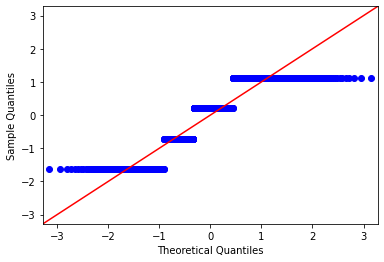

In [ ]:
# a qq plot of sample 1
fig = sm.qqplot(df1['JobSatisfaction'], fit = True, line= '45')
plt.show()


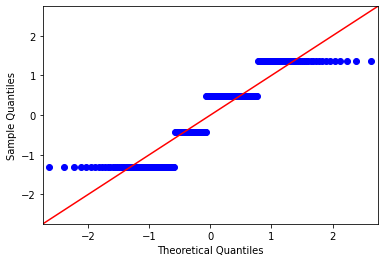

In [ ]:
# a qq plot of sample 2
fig = sm.qqplot(df2['JobSatisfaction'], fit = True, line= '45')
plt.show()

In [ ]:
print(s1.mean())

print(s2.mean())

2.92
2.44


In [ ]:
# let us perfrom our ttest
tstat, pval = stats.ttest_rel(s1, s2)
print('t statistic is: ', tstat)
print('p value is: ', pval)


t statistic is:  2.0189741204714458
p value is:  0.04897887708736376


In [ ]:
# let us use a loop to analyse our results
if pval<0.05:
    print("Reject null hypothesis")
else:
    print("Accept null hypothesis")


Reject null hypothesis


Rejecting the null hypothesis means that we have enough statistical evidence to state that, There is a statistically significant difference in satisfaction level between employees who retained and those who left.

# Conclusion

We set out to identify determinant factors that lead to staff attrition in a company. 

From our analysis we have found that:

There is a high number of staff attrition among employees with low job satisfaction levels.

The attrition rate is highest between 28-32 year olds. Young people tend to move from company to company.

The rate of attrition is highest among employees with the lowest income levels i.e. less than $4,000 monthly.

Single people in general had a higher attrition rate compared to married or divorced employees.

Employees in the Human Resources and Sales departments had a higher attrition rate compared to other departments. 

Employees who travelled frequently experienced higher attrition rates in general.

Males generally had more attrition rates, although the difference to females was not that large.

From this analysis, we can conclude that low job satisfaction level, low monthly income, marital status, age and long distance to and from work are among the main causes of staff attrition in the company. 
